# Logs and Result Analysis

We import logs from bonsai training session and parse it to retrieve data
(20190129)

In [1]:
import numpy as np
import pandas as pd
import plotly
import cufflinks as cf
import os
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
plotly.offline.init_notebook_mode(connected=True)
cf.go_offline()

# List all iteration logfiles in log directory

### list all logfiles in pathlog

In [2]:
os.listdir(os.path.join("..", "log"))

['2019-01-30-00_39_22_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_42_02_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_43_02_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_42_16_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_42_20_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_39_25_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_40_26_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_39_42_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_40_49_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_41_06_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_39_16_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_38_57_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_39_45_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_40_15_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_41_46_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_42_51_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_42_27_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_41_50_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_42_32_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_40_33_newTKHVAC_TRAINING.csv',
 '2019-01-30-00_41_30_newTKHVAC_TRAINING.csv',
 '2019-01-30-

#### Import and parse log file
Define the filenamle of the log you want to analyze 

In [3]:
filename = os.path.join("..", "log", os.listdir(os.path.join("..", "log"))[-1])
logdf = pd.read_csv(filename, skipinitialspace=True, nrows=10**6)
logdf.head()

,episode_count,iteration_count,terminal,reward,episode_reward,Tset,Tset1,Tset2,Tset3,Tin,Tout,power,K,C,brainhvacON,simhvacON
0,1,0,False,0.00000,0.00000,25.0,25.0,25.0,25.0,30.000000,32.0,0.0,0.5,0.3,1,1
1,1,1,False,0.00000,0.00000,25.0,25.0,25.0,25.0,30.277778,32.0,0.0,0.5,0.3,0,0
2,1,2,False,0.00000,0.00000,25.0,25.0,25.0,25.0,28.016975,32.0,27.0,0.5,0.3,1,1
3,1,3,False,0.00000,0.00000,25.0,25.0,25.0,25.0,26.070173,32.0,27.0,0.5,0.3,1,1
4,1,4,False,0.39376,0.39376,25.0,25.0,25.0,25.0,24.393760,32.0,27.0,0.5,0.3,1,1


In [4]:
# import glob
# from functools import partial
# read_csv_skip = partial(pd.read_csv, skipinitialspace=True)
# logdf = pd.concat(map(read_csv_skip, glob.glob(os.path.join('..', "log", "*.csv"))))

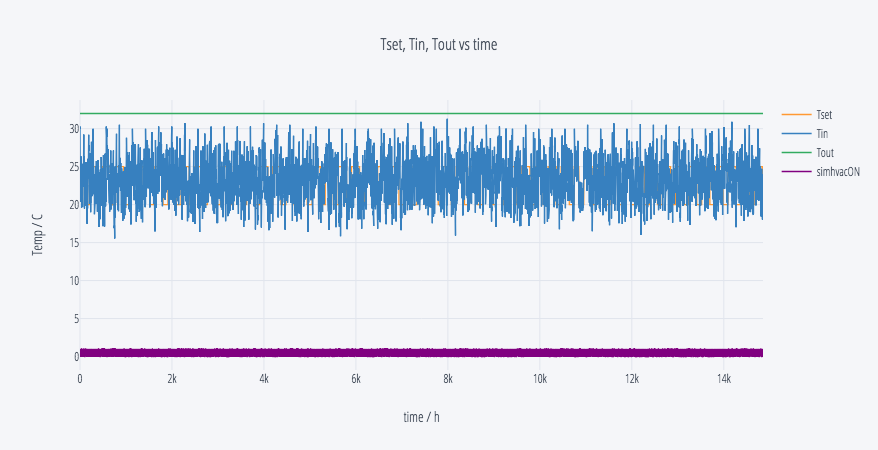

In [5]:
columns = ['Tset','Tin','Tout','simhvacON']
logdf[columns].iplot(xTitle='time / h', yTitle = 'Temp / C ',title = 'Tset, Tin, Tout vs time')

## Visualizing with hvacON and associated reward

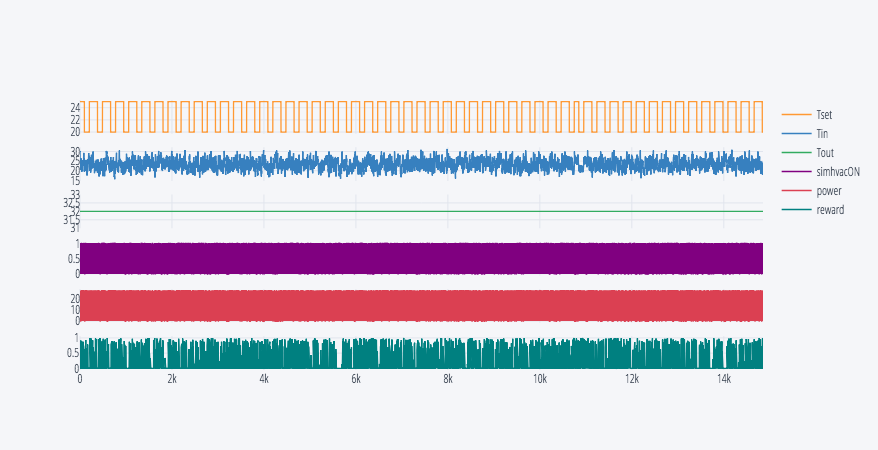

In [6]:
columns = ['Tset','Tin','Tout','simhvacON','power','reward']
logdf[columns].iplot(subplots=True,shared_xaxes=True,shape=(6,1))